In [10]:
!pip install --quiet git+https://github.com/greentfrapp/lucent.git

In [1]:
import torch
import numpy as np
import scipy.ndimage as nd
from PIL import Image

from torchvision.models import resnet50
from lucent.modelzoo import inceptionv1

from lucent.optvis import render, param, transform
import lucent.optvis.objectives as objectives
import lucent.optvis.objectives as objectives
from lucent.modelzoo.util import get_model_layers
from lucent.misc.io import show

In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = resnet50(pretrained=True)
model.to(device).eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
# Define the objective for the specific neuron
layer = 'layer3_2_conv3'
neuron = 767
obj = objectives.neuron(layer, neuron)

# Render the visualization
im = render.render_vis(model, obj)

# Save the image
import matplotlib.pyplot as plt
plt.imsave(f'{layer}_{neuron}.PNG', im[-&].cpu().numpy().transpose(1, 2, 0))

  0%|          | 0/512 [00:00<?, ?it/s]

100%|██████████| 512/512 [05:11<00:00,  1.65it/s]


AttributeError: 'numpy.ndarray' object has no attribute 'permute'

In [ ]:
#obj = "layer2:9"
obj = objectives.channel("layer2", 9)
render.render_vis(model, obj)

In [3]:
@objectives.wrap_objective()
def dot_compare(layer, batch=1, cossim_pow=0):
  def inner(T):
    dot = (T(layer)[batch] * T(layer)[0]).sum()
    mag = torch.sqrt(torch.sum(T(layer)[0]**2))
    cossim = dot/(1e-6 + mag)
    return -dot * cossim ** cossim_pow
  return inner

In [4]:
def feature_inversion(img, layer=None, n_steps=512, cossim_pow=0.0):
  # Convert image to torch.tensor and scale image
  img = torch.tensor(np.transpose(img, [2, 0, 1])).to(device)  # Convert to PyTorch tensor
  img = torch.nn.functional.interpolate(img.unsqueeze(0), size=(224, 224), mode='bilinear', align_corners=False).squeeze(0)  # Resize

  upsample = torch.nn.Upsample(224)
  img = upsample(img)
  
  obj = objectives.Objective.sum([
    1.0 * dot_compare(layer, cossim_pow=cossim_pow),
    objectives.blur_input_each_step(),
  ])

  # Initialize parameterized input and stack with target image
  # to be accessed in the objective function
  params, image_f = param.image(224)
  def stacked_param_f():
    return params, lambda: torch.stack([image_f()[0], img])

  transforms = [
    transform.pad(8, mode='constant', constant_value=.5),
    transform.jitter(8),
    transform.random_scale([0.9, 0.95, 1.05, 1.1] + [1]*4),
    transform.random_rotate(list(range(-5, 5)) + [0]*5),
    transform.jitter(2),
  ]

  _ = render.render_vis(model, obj, stacked_param_f, transforms=transforms, thresholds=(n_steps,), show_image=False, progress=False)

  show(_[0][0])

In [11]:
img = np.array(Image.open("Ressources/panda.jpg"), dtype=np.float32)

valid_layers = get_model_layers(model)
print(valid_layers)

layers = ['conv1'] + \
         ['layer1_0_conv%d' % i for i in range(1, 4)] + \
         ['layer1_1_conv%d' % i for i in range(1, 4)] + \
         ['layer1_2_conv%d' % i for i in range(1, 4)] + \
         ['layer2_0_conv%d' % i for i in range(1, 4)] + \
         ['layer2_1_conv%d' % i for i in range(1, 4)] + \
         ['layer2_2_conv%d' % i for i in range(1, 4)] + \
         ['layer3_0_conv%d' % i for i in range(1, 4)] + \
         ['layer3_1_conv%d' % i for i in range(1, 4)] + \
         ['layer3_2_conv%d' % i for i in range(1, 4)] + \
         ['layer4_0_conv%d' % i for i in range(1, 4)] + \
         ['layer4_1_conv%d' % i for i in range(1, 4)] + \
         ['layer4_2_conv%d' % i for i in range(1, 4)]

['conv1', 'bn1', 'relu', 'maxpool', 'layer1', 'layer1_0', 'layer1_0_conv1', 'layer1_0_bn1', 'layer1_0_conv2', 'layer1_0_bn2', 'layer1_0_conv3', 'layer1_0_bn3', 'layer1_0_relu', 'layer1_0_downsample', 'layer1_0_downsample_0', 'layer1_0_downsample_1', 'layer1_1', 'layer1_1_conv1', 'layer1_1_bn1', 'layer1_1_conv2', 'layer1_1_bn2', 'layer1_1_conv3', 'layer1_1_bn3', 'layer1_1_relu', 'layer1_2', 'layer1_2_conv1', 'layer1_2_bn1', 'layer1_2_conv2', 'layer1_2_bn2', 'layer1_2_conv3', 'layer1_2_bn3', 'layer1_2_relu', 'layer2', 'layer2_0', 'layer2_0_conv1', 'layer2_0_bn1', 'layer2_0_conv2', 'layer2_0_bn2', 'layer2_0_conv3', 'layer2_0_bn3', 'layer2_0_relu', 'layer2_0_downsample', 'layer2_0_downsample_0', 'layer2_0_downsample_1', 'layer2_1', 'layer2_1_conv1', 'layer2_1_bn1', 'layer2_1_conv2', 'layer2_1_bn2', 'layer2_1_conv3', 'layer2_1_bn3', 'layer2_1_relu', 'layer2_2', 'layer2_2_conv1', 'layer2_2_bn1', 'layer2_2_conv2', 'layer2_2_bn2', 'layer2_2_conv3', 'layer2_2_bn3', 'layer2_2_relu', 'layer2_3', 

conv1



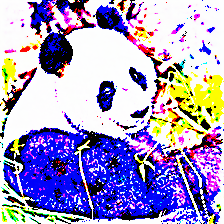


layer1_0_conv1



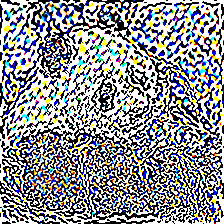


layer1_0_conv2



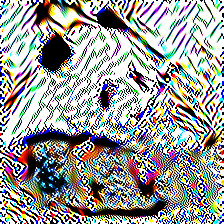


layer1_0_conv3



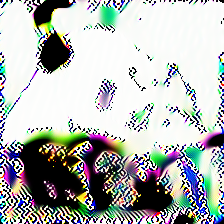


layer1_1_conv1



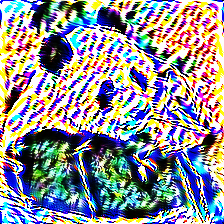


layer1_1_conv2



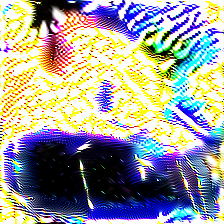


layer1_1_conv3



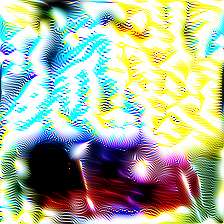


layer1_2_conv1



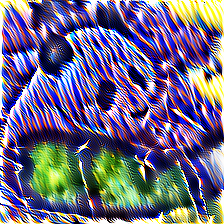


layer1_2_conv2



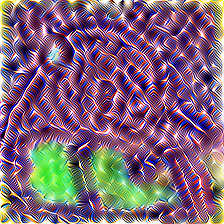


layer1_2_conv3



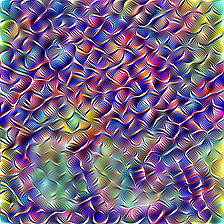


layer2_0_conv1



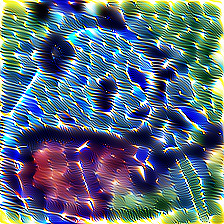


layer2_0_conv2



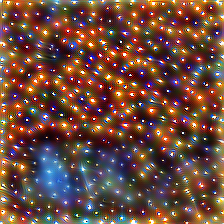


layer2_0_conv3



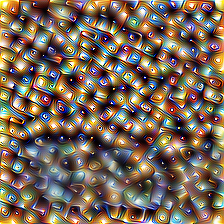


layer2_1_conv1



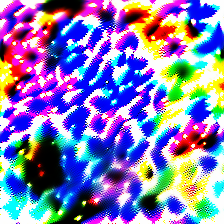


layer2_1_conv2



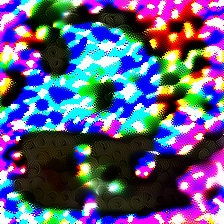


layer2_1_conv3



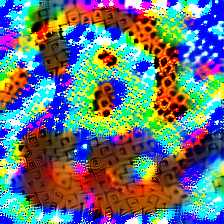


layer2_2_conv1



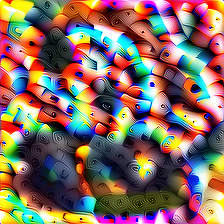


layer2_2_conv2



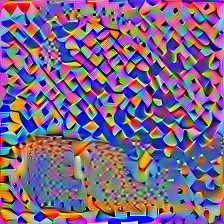


layer2_2_conv3



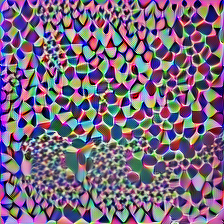


layer3_0_conv1



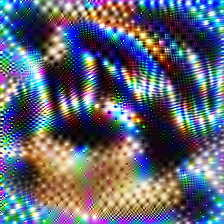


layer3_0_conv2



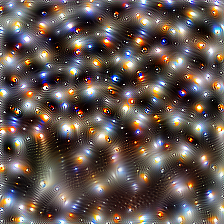


layer3_0_conv3



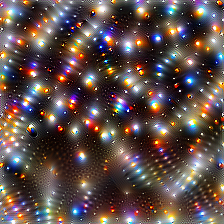


layer3_1_conv1



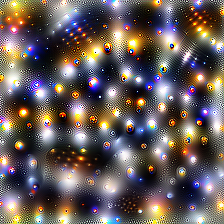


layer3_1_conv2



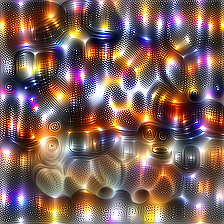


layer3_1_conv3



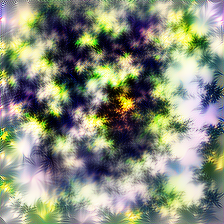


layer3_2_conv1



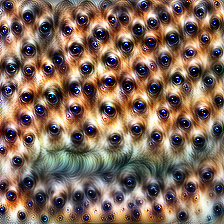


layer3_2_conv2



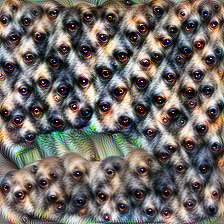


layer3_2_conv3



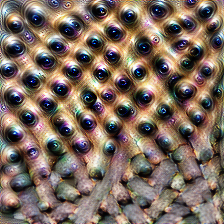


layer4_0_conv1



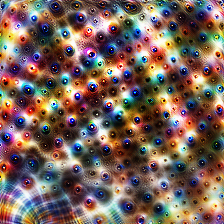


layer4_0_conv2



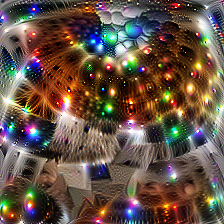


layer4_0_conv3



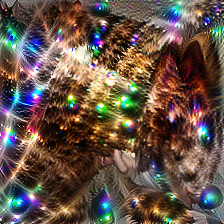


layer4_1_conv1



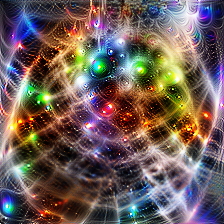


layer4_1_conv2



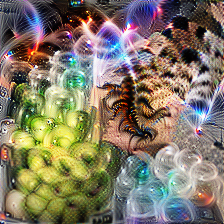


layer4_1_conv3



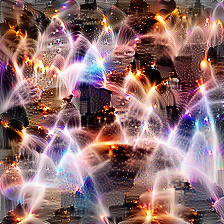


layer4_2_conv1



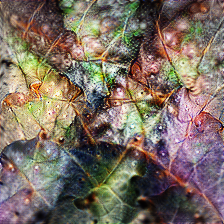


layer4_2_conv2



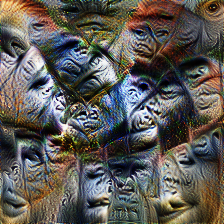


layer4_2_conv3



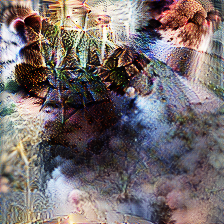

In [9]:
for layer in layers:
  print(layer)
  feature_inversion(img, layer=layer)
  print()

In [5]:
img = np.array(Image.open("output/panda_perturbed.jpg"), dtype=np.float32)

valid_layers = get_model_layers(model)
print(valid_layers)

layers = ['layer3_0_conv%d' % i for i in range(1, 4)] + \
         ['layer3_1_conv%d' % i for i in range(1, 4)] + \
         ['layer3_2_conv%d' % i for i in range(1, 4)] + \
         ['layer4_0_conv%d' % i for i in range(1, 4)] + \
         ['layer4_1_conv%d' % i for i in range(1, 4)] + \
         ['layer4_2_conv%d' % i for i in range(1, 4)]

['conv1', 'bn1', 'relu', 'maxpool', 'layer1', 'layer1_0', 'layer1_0_conv1', 'layer1_0_bn1', 'layer1_0_conv2', 'layer1_0_bn2', 'layer1_0_conv3', 'layer1_0_bn3', 'layer1_0_relu', 'layer1_0_downsample', 'layer1_0_downsample_0', 'layer1_0_downsample_1', 'layer1_1', 'layer1_1_conv1', 'layer1_1_bn1', 'layer1_1_conv2', 'layer1_1_bn2', 'layer1_1_conv3', 'layer1_1_bn3', 'layer1_1_relu', 'layer1_2', 'layer1_2_conv1', 'layer1_2_bn1', 'layer1_2_conv2', 'layer1_2_bn2', 'layer1_2_conv3', 'layer1_2_bn3', 'layer1_2_relu', 'layer2', 'layer2_0', 'layer2_0_conv1', 'layer2_0_bn1', 'layer2_0_conv2', 'layer2_0_bn2', 'layer2_0_conv3', 'layer2_0_bn3', 'layer2_0_relu', 'layer2_0_downsample', 'layer2_0_downsample_0', 'layer2_0_downsample_1', 'layer2_1', 'layer2_1_conv1', 'layer2_1_bn1', 'layer2_1_conv2', 'layer2_1_bn2', 'layer2_1_conv3', 'layer2_1_bn3', 'layer2_1_relu', 'layer2_2', 'layer2_2_conv1', 'layer2_2_bn1', 'layer2_2_conv2', 'layer2_2_bn2', 'layer2_2_conv3', 'layer2_2_bn3', 'layer2_2_relu', 'layer2_3', 

layer3_0_conv1



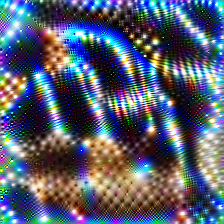


layer3_0_conv2



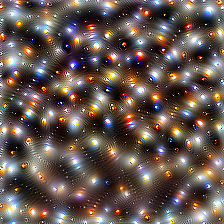


layer3_0_conv3



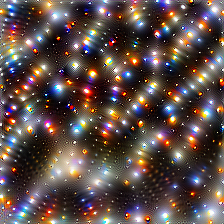


layer3_1_conv1



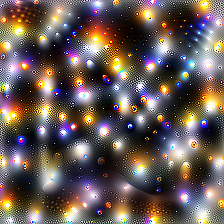


layer3_1_conv2



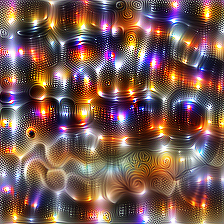


layer3_1_conv3



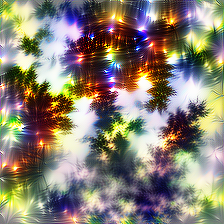


layer3_2_conv1



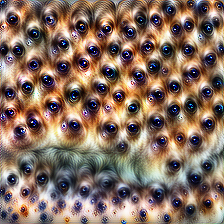


layer3_2_conv2



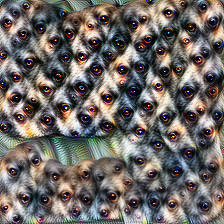


layer3_2_conv3



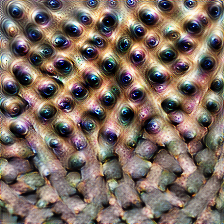


layer4_0_conv1



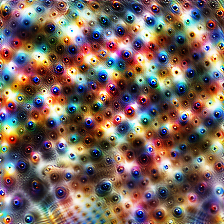


layer4_0_conv2



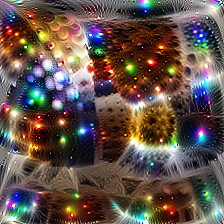


layer4_0_conv3



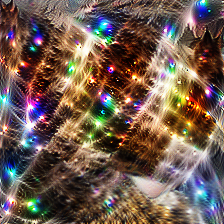


layer4_1_conv1



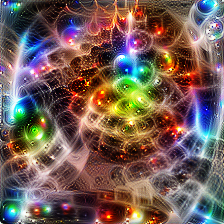


layer4_1_conv2



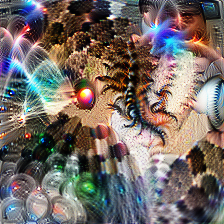


layer4_1_conv3


In [ ]:
for layer in layers:
  print(layer)
  feature_inversion(img, layer=layer)
  print()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = inceptionv1(pretrained=True)
model.to(device).eval()

def arbitrary_channels_to_rgb(*args, channels=None, **kwargs):
    channels = channels or 10
    full_im = param.image(*args, channels=channels, **kwargs)  # Assuming param.image returns a tensor

    r = torch.mean(full_im[..., :channels//3]**2, dim=-1)
    g = torch.mean(full_im[..., channels//3:2*channels//3]**2, dim=-1)
    b = torch.mean(full_im[..., 2*channels//3:]**2, dim=-1)

    return torch.stack([r, g, b], dim=-1)

_ = render.render_vis(model, objectives.deepdream("mixed4a_pre_relu"), param_f=lambda:arbitrary_channels_to_rgb(128, channels=10))
_ = render.render_vis(model, objectives.channel("mixed4a_pre_relu", 360), param_f=lambda:arbitrary_channels_to_rgb(128, channels=10))
_ = render.render_vis(model, objectives.neuron("mixed4a_pre_relu", 476), param_f=lambda:arbitrary_channels_to_rgb(128, channels=10))

AttributeError: module 'lucent.optvis.objectives' has no attribute 'deepdream'

In [9]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = inceptionv1(pretrained=True)
model.to(device).eval()

InceptionV1(
  (conv2d0_pre_relu_conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2))
  (conv2d1_pre_relu_conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  (conv2d2_pre_relu_conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1))
  (mixed3a_1x1_pre_relu_conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1))
  (mixed3a_3x3_bottleneck_pre_relu_conv): Conv2d(192, 96, kernel_size=(1, 1), stride=(1, 1))
  (mixed3a_5x5_bottleneck_pre_relu_conv): Conv2d(192, 16, kernel_size=(1, 1), stride=(1, 1))
  (mixed3a_pool_reduce_pre_relu_conv): Conv2d(192, 32, kernel_size=(1, 1), stride=(1, 1))
  (mixed3a_3x3_pre_relu_conv): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
  (mixed3a_5x5_pre_relu_conv): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
  (mixed3b_1x1_pre_relu_conv): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1))
  (mixed3b_3x3_bottleneck_pre_relu_conv): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1))
  (mixed3b_5x5_bottleneck_pre_relu_conv): Conv2d(256, 32, 

In [11]:
layers = get_model_layers(model)

for layer in layers:
    print(layer)

conv2d0_pre_relu_conv
conv2d1_pre_relu_conv
conv2d2_pre_relu_conv
mixed3a_1x1_pre_relu_conv
mixed3a_3x3_bottleneck_pre_relu_conv
mixed3a_5x5_bottleneck_pre_relu_conv
mixed3a_pool_reduce_pre_relu_conv
mixed3a_3x3_pre_relu_conv
mixed3a_5x5_pre_relu_conv
mixed3b_1x1_pre_relu_conv
mixed3b_3x3_bottleneck_pre_relu_conv
mixed3b_5x5_bottleneck_pre_relu_conv
mixed3b_pool_reduce_pre_relu_conv
mixed3b_3x3_pre_relu_conv
mixed3b_5x5_pre_relu_conv
mixed4a_1x1_pre_relu_conv
mixed4a_3x3_bottleneck_pre_relu_conv
mixed4a_5x5_bottleneck_pre_relu_conv
mixed4a_pool_reduce_pre_relu_conv
mixed4a_3x3_pre_relu_conv
mixed4a_5x5_pre_relu_conv
mixed4b_1x1_pre_relu_conv
mixed4b_3x3_bottleneck_pre_relu_conv
mixed4b_5x5_bottleneck_pre_relu_conv
mixed4b_pool_reduce_pre_relu_conv
mixed4b_3x3_pre_relu_conv
mixed4b_5x5_pre_relu_conv
mixed4c_1x1_pre_relu_conv
mixed4c_3x3_bottleneck_pre_relu_conv
mixed4c_5x5_bottleneck_pre_relu_conv
mixed4c_pool_reduce_pre_relu_conv
mixed4c_3x3_pre_relu_conv
mixed4c_5x5_pre_relu_conv
mixe

In [12]:
# Define the objective for the specific neuron
obj = objectives.neuron('mixed3b', 379)

# Render the visualization
render.render_vis(model, obj)

  0%|          | 0/512 [00:00<?, ?it/s]

100%|██████████| 512/512 [04:10<00:00,  2.04it/s]


[array([[[[0.48875844, 0.49945652, 0.51469254],
          [0.49663582, 0.5036614 , 0.5224596 ],
          [0.4990576 , 0.50506955, 0.51984334],
          ...,
          [0.48373705, 0.49465296, 0.5111007 ],
          [0.4796943 , 0.48946056, 0.50569826],
          [0.48203918, 0.49492952, 0.50926435]],
 
         [[0.48901922, 0.4995002 , 0.5175389 ],
          [0.49767318, 0.50229675, 0.52077264],
          [0.49773815, 0.5039509 , 0.5189032 ],
          ...,
          [0.48074242, 0.49031144, 0.5062977 ],
          [0.48038688, 0.4921759 , 0.50943017],
          [0.4883992 , 0.49985698, 0.5165575 ]],
 
         [[0.49039072, 0.49881744, 0.5178326 ],
          [0.4954818 , 0.49911425, 0.5179547 ],
          [0.49531716, 0.50189084, 0.519517  ],
          ...,
          [0.48666096, 0.4961577 , 0.51336074],
          [0.49031666, 0.5031345 , 0.51983196],
          [0.48636937, 0.49714053, 0.512718  ]],
 
         ...,
 
         [[0.4967971 , 0.5059574 , 0.5199077 ],
          [0.50485

In [28]:
img = np.array(Image.open("Ressources/panda.jpg"), dtype=np.float32)

layers = ['conv2d%d' % i for i in range(0, 3)] + \
         ['mixed3a', 'mixed3b', 'mixed4a',
          'mixed4b', 'mixed4c', 'mixed4d',
          'mixed4e', 'mixed5a', 'mixed5b']

conv2d0



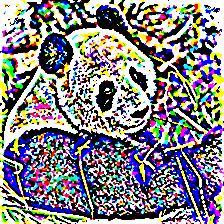


conv2d1



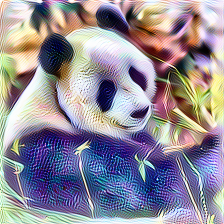


conv2d2



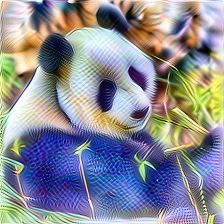


mixed3a



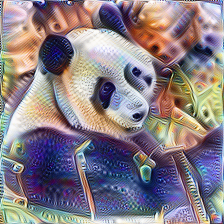


mixed3b



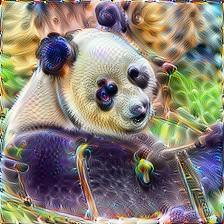


mixed4a



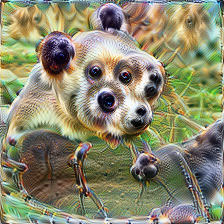


mixed4b



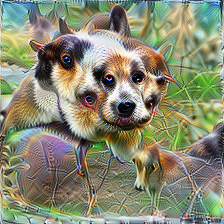


mixed4c



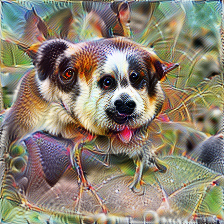


mixed4d



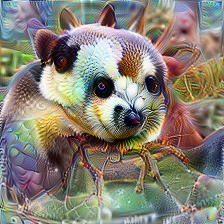


mixed4e



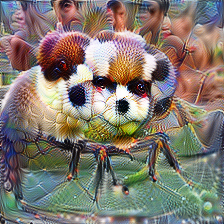


mixed5a



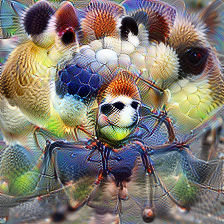


mixed5b



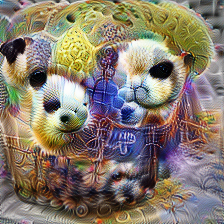

In [29]:
for layer in layers:
  print(layer)
  feature_inversion(img, layer=layer)
  print()